In [1]:
# Only use once to install the required packages
# !pip install -r requirements.txt

In [2]:
import pprint
import subprocess
import requests
import json
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import seaborn as sns
import missingno as msno
from scipy.stats import chi2
from sklearn.impute import SimpleImputer
import plotly.express as px
from scipy.stats import skew
import nbformat
from nbconvert import PDFExporter
import os

In [3]:
# Fetch data from the URL and save it as a JSON file
url = "https://jhucoronavirus.azureedge.net/api/v1/testing/daily.json"
response = requests.get(url)
if response.status_code == 200:
    data = response.json()
    with open("data.json", "w") as file:
        json.dump(data, file)
        print("Data saved successfully as data.json")
else:
    print("Failed to fetch data from the API")

# Load the data from the JSON file into a Pandas DataFrame
with open("data.json", "r") as file:
    data = json.load(file)
df = pd.DataFrame(data)

# Convert the 'date' column to datetime format
df['date'] = pd.to_datetime(df['date'], format='%Y%m%d')
print("Data loaded successfully")

Data saved successfully as data.json
Data loaded successfully


### Before Diving into data it is important to know meta data of the data set. It helps in understanding problem statement and also give comprehensive coverage about dataset.
### Metadata is available at : 
* 1. https://github.com/govex/COVID-19/blob/master/data_tables/testing_data/time_series_covid19_US_data_dictionary.csv
* 2. https://github.com/govex/COVID-19/tree/master/data_tables/testing_data



In [4]:
# Adding Metadata to the JSON file for future use.

# Define the metadata
metadata = {
    "date": "Date on which data was collected",
    "state": "Two-letter abbreviation for the state or territory",
    "cases_conf_probable": "Total number of confirmed plus probable cases of COVID-19",
    "cases_confirmed": "Total number of confirmed cases of COVID-19",
    "cases_probable": "Total number of probable cases of COVID-19",
    "tests_viral_positive": "Cumulative number of completed PCR tests (or specimens tested) or other approved nucleic acid amplification test (NAAT) that return positive",
    "tests_viral_negative": "Cumulative number of completed PCR tests (or specimens tested) or other approved nucleic acid amplification test (NAAT) that return negative",
    "tests_viral_total": "Cumulative number of completed PCR tests (or specimens tested) or other approved nucleic acid amplification test (NAAT)",
    "tests_antigen_positive": "Cumulative number of completed antigen tests that return positive",
    "tests_antigen_total": "Cumulative number of completed antigen tests",
    "people_viral_positive": "Cumulative number of unique people with a positive PCR or other approved nucleic acid amplification test (NAAT)",
    "people_viral_total": "Cumulative number of unique people tested at least once via PCR testing or other approved nucleic acid amplification test (NAAT)",
    "people_antigen_positive": "Cumulative number of unique people with a completed antigen test that returned positive",
    "people_antigen_total": "Cumulative number of unique people who have been tested at least once via antigen testing",
    "encounters_viral_total": "Cumulative number of people tested per day via PCR testing or other approved nucleic acid amplification test (NAAT)",
    "tests_combined_total": "Derived from other metrics (see readme for more details)"
}

# Read the existing data from data.json
with open('data.json', 'r') as f:
    data = json.load(f)

# Combine metadata and data
combined_data = {
    "metadata": metadata,
    "data": data
}

# Write the combined structure back to data.json
with open('data.json', 'w') as f:
    json.dump(combined_data, f, indent=4)

print("Metadata added successfully.")



Metadata added successfully.


### Highlevel overview of dataset.

In [5]:
# Basic information about the data
print("Shape of the DataFrame:", df.shape)


Shape of the DataFrame: (36628, 14)


The DataFrame has 36,628 rows and 14 columns.

In [6]:
pprint.pprint(df.columns.tolist())

['date',
 'state',
 'people_viral_positive',
 'tests_viral_positive',
 'tests_viral_negative',
 'encounters_viral_total',
 'tests_viral_total',
 'people_viral_total',
 'tests_combined_total',
 'cases_conf_probable',
 'people_antigen_positive',
 'people_antigen_total',
 'cases_confirmed',
 'cases_probable']


List of columns available in dataset. Observation: Not all the columns are present fetched data which are present in metadata, Hence, There might be some availibility of data apart from the fetched data.

In [7]:
# Read the metadata from the data.json file
with open('data.json', 'r') as f:
    data = json.load(f)
metadata = data['metadata']

# Get the column names from the DataFrame
column_names = df.columns.tolist()

# Compare the metadata with the column names
for column in column_names:
    if column in metadata:
        print(f"Column: {column}")
        print(f"Description: {metadata[column]}")
        print()
    else:
        print(f"No description available for column: {column}")
        print()

Column: date
Description: Date on which data was collected

Column: state
Description: Two-letter abbreviation for the state or territory

Column: people_viral_positive
Description: Cumulative number of unique people with a positive PCR or other approved nucleic acid amplification test (NAAT)

Column: tests_viral_positive
Description: Cumulative number of completed PCR tests (or specimens tested) or other approved nucleic acid amplification test (NAAT) that return positive

Column: tests_viral_negative
Description: Cumulative number of completed PCR tests (or specimens tested) or other approved nucleic acid amplification test (NAAT) that return negative

Column: encounters_viral_total
Description: Cumulative number of people tested per day via PCR testing or other approved nucleic acid amplification test (NAAT)

Column: tests_viral_total
Description: Cumulative number of completed PCR tests (or specimens tested) or other approved nucleic acid amplification test (NAAT)

Column: people_v

In [8]:
# Display basic information about the data
print("Data Overview:")
print(df.info())

Data Overview:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 36628 entries, 0 to 36627
Data columns (total 14 columns):
 #   Column                   Non-Null Count  Dtype         
---  ------                   --------------  -----         
 0   date                     36628 non-null  datetime64[ns]
 1   state                    36628 non-null  object        
 2   people_viral_positive    33176 non-null  float64       
 3   tests_viral_positive     17036 non-null  float64       
 4   tests_viral_negative     10165 non-null  float64       
 5   encounters_viral_total   9188 non-null   float64       
 6   tests_viral_total        27846 non-null  float64       
 7   people_viral_total       16198 non-null  float64       
 8   tests_combined_total     36417 non-null  float64       
 9   cases_conf_probable      36321 non-null  float64       
 10  people_antigen_positive  1482 non-null   float64       
 11  people_antigen_total     2165 non-null   float64       
 12  cases_confirmed  

In [9]:
# First few rows of the data
print("\nFirst few rows of the DataFrame:")
df.head()


First few rows of the DataFrame:


,date,state,people_viral_positive,tests_viral_positive,tests_viral_negative,encounters_viral_total,tests_viral_total,people_viral_total,tests_combined_total,cases_conf_probable,people_antigen_positive,people_antigen_total,cases_confirmed,cases_probable
0,2020-03-06,AK,NaN,NaN,NaN,NaN,8.0,NaN,8.0,NaN,NaN,NaN,NaN,NaN
1,2020-03-07,AK,NaN,NaN,NaN,NaN,12.0,NaN,12.0,NaN,NaN,NaN,NaN,NaN
2,2020-03-08,AK,NaN,NaN,NaN,NaN,14.0,NaN,14.0,NaN,NaN,NaN,NaN,NaN
3,2020-03-09,AK,NaN,NaN,NaN,NaN,23.0,NaN,23.0,NaN,NaN,NaN,NaN,NaN
4,2020-03-10,AK,NaN,NaN,NaN,NaN,23.0,NaN,23.0,NaN,NaN,NaN,NaN,NaN


In [10]:
# Summary statistics
print("\nSummary Statistics:")
print(df.describe().to_string())


Summary Statistics:
                                date  people_viral_positive  tests_viral_positive  tests_viral_negative  encounters_viral_total  tests_viral_total  people_viral_total  tests_combined_total  cases_conf_probable  people_antigen_positive  people_antigen_total  cases_confirmed  cases_probable
count                          36628           3.317600e+04          1.703600e+04          1.016500e+04            9.188000e+03       2.784600e+04        1.619800e+04          3.641700e+04         3.632100e+04              1482.000000          2.165000e+03     1.394500e+04    13944.000000
mean   2021-01-22 08:21:10.634487040           3.790848e+05          4.318515e+05          3.823510e+06            6.631937e+06       5.432242e+06        1.737529e+06          5.424406e+06         3.855561e+05             64240.545884          4.129541e+05     6.252463e+05    66616.499211
min              2020-01-13 00:00:00           0.000000e+00          0.000000e+00          1.000000e+00      

1. **Dataset Span and Entries**:
   - The dataset spans from early 2020 to late 2021, with over 36,000 entries.
   - This collection provides a detailed view of COVID-19 metrics across different states and time periods.

2. **Cumulative Viral Tests**:
   - The mean number of cumulative viral tests conducted is approximately 5.4 million, with a standard deviation of around 10.3 million.
   - This indicates substantial variability in testing efforts, suggesting differences in testing strategies and capacities over time and across regions.


In [11]:
# Find null values
null_values = df.isnull().sum()

# Calculate proportion of null values
proportion_null = null_values / len(df)

# Display the results
print("Null Values:")
print(null_values)
print("\nProportion of Null Values:")
print(proportion_null)

Null Values:
date                           0
state                          0
people_viral_positive       3452
tests_viral_positive       19592
tests_viral_negative       26463
encounters_viral_total     27440
tests_viral_total           8782
people_viral_total         20430
tests_combined_total         211
cases_conf_probable          307
people_antigen_positive    35146
people_antigen_total       34463
cases_confirmed            22683
cases_probable             22684
dtype: int64

Proportion of Null Values:
date                       0.000000
state                      0.000000
people_viral_positive      0.094245
tests_viral_positive       0.534891
tests_viral_negative       0.722480
encounters_viral_total     0.749154
tests_viral_total          0.239762
people_viral_total         0.557770
tests_combined_total       0.005761
cases_conf_probable        0.008382
people_antigen_positive    0.959539
people_antigen_total       0.940892
cases_confirmed            0.619280
cases_probable  

### Visualizing some trends and patterns in data to understand it better.

In [12]:
# You can choose any column to visualize, here we'll use 'people_viral_positive' as an example
fig = px.choropleth(
    data_frame=df,
    locations='state', # Column with the state abbreviations
    locationmode='USA-states', # USA state names mode
    color='people_viral_positive', # The column to use for coloring the states
    scope='usa', # Scope of the map
    title='Cumulative Number of Unique People with a Positive PCR or other approved NAAT by State',
    hover_data=['people_viral_positive', 'tests_viral_positive', 'tests_viral_negative', 'encounters_viral_total', 'tests_viral_total', 'people_viral_total', 'tests_combined_total', 'cases_conf_probable', 'people_antigen_positive', 'people_antigen_total', 'cases_confirmed', 'cases_probable'], # Columns to show on hover
    labels={'people_viral_positive': 'People Viral Positive'} # Label for the color bar
)

# Show the figure
fig.show()

Skewness of people_viral_positive: 3.548020112389919
Skewness of tests_viral_positive: 3.371582230487478
Skewness of tests_viral_negative: 3.8345046676341257
Skewness of encounters_viral_total: 3.831696441508449
Skewness of tests_viral_total: 5.091221511790377
Skewness of people_viral_total: 2.635336506089326
Skewness of tests_combined_total: 4.822040972180646
Skewness of cases_conf_probable: 3.4299107404248304
Skewness of people_antigen_positive: 0.36117776996553547
Skewness of people_antigen_total: 0.7294910021118777
Skewness of cases_confirmed: 2.7053008894090596
Skewness of cases_probable: 2.730476811686504


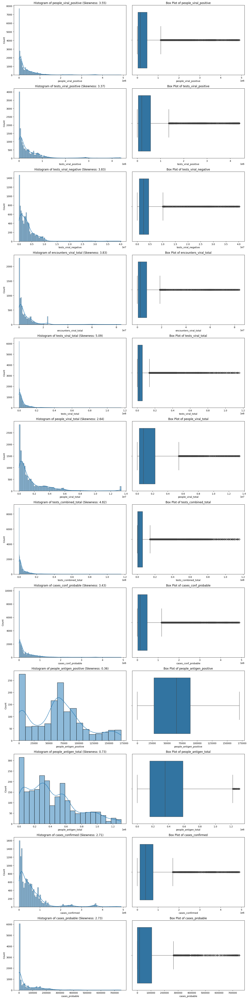

In [13]:
# List of columns to analyze for skewness
columns_to_analyze = [
    'people_viral_positive', 'tests_viral_positive', 'tests_viral_negative', 
    'encounters_viral_total', 'tests_viral_total', 'people_viral_total', 
    'tests_combined_total', 'cases_conf_probable', 'people_antigen_positive', 
    'people_antigen_total', 'cases_confirmed', 'cases_probable'
]

# Calculate skewness for each column and print it
skewness_values = {}
for column in columns_to_analyze:
    skewness_values[column] = skew(df[column].dropna())
    print(f'Skewness of {column}: {skewness_values[column]}')

# Plot histograms and box plots for each column
fig, axes = plt.subplots(nrows=len(columns_to_analyze), ncols=2, figsize=(15, len(columns_to_analyze) * 5))

for i, column in enumerate(columns_to_analyze):
    sns.histplot(df[column].dropna(), kde=True, ax=axes[i, 0])
    axes[i, 0].set_title(f'Histogram of {column} (Skewness: {skewness_values[column]:.2f})')

    sns.boxplot(x=df[column].dropna(), ax=axes[i, 1])
    axes[i, 1].set_title(f'Box Plot of {column}')

plt.tight_layout()
plt.show()

Observation:

people_viral_positive (Skewness: 3.55)
Histogram: The distribution is heavily right-skewed, with a long tail on the right side. Most values are concentrated on the lower end.
Box Plot: Shows many outliers on the higher end, indicating significant variability and extreme values.

tests_viral_positive (Skewness: 3.37)
Histogram: Similar to the previous column, this distribution is also heavily right-skewed with most values concentrated on the lower end.
Box Plot: A large number of outliers on the higher end.

tests_viral_negative (Skewness: 3.81)
Histogram: The distribution is right-skewed, with most values on the lower end and a few extreme values on the higher end.
Box Plot: Indicates many outliers, suggesting high variability.

encounters_viral_total (Skewness: 3.83)
Histogram: Heavily right-skewed distribution with values concentrated on the lower end.
Box Plot: Shows a high number of outliers.

tests_viral_total (Skewness: 5.09)
Histogram: Very heavily right-skewed, with a sharp peak at the lower end and a long tail on the right.
Box Plot: Many outliers indicating significant variability and extreme values.

people_viral_total (Skewness: 2.64)
Histogram: Right-skewed distribution, though slightly less extreme than some other columns.
Box Plot: Many outliers, but the spread is somewhat narrower compared to others.

tests_combined_total (Skewness: 4.62)
Histogram: Very heavily right-skewed with most values on the lower end.
Box Plot: Shows a significant number of outliers, indicating high variability.

cases_conf_probable (Skewness: 3.43)
Histogram: Heavily right-skewed distribution.
Box Plot: High number of outliers, indicating significant variability and extreme values.

people_antigen_positive (Skewness: 0.36)
Histogram: Distribution is close to normal, with some slight right skewness.
Box Plot: Fewer outliers compared to other columns, indicating more consistent data.

people_antigen_total (Skewness: 0.79)
Histogram: Slightly right-skewed, closer to normal distribution.
Box Plot: Some outliers, but generally more consistent data.

cases_confirmed (Skewness: 2.71)
Histogram: Right-skewed distribution.
Box Plot: Many outliers, indicating significant variability and extreme values.

cases_probable (Skewness: 2.73)
Histogram: Right-skewed distribution.
Box Plot: Shows a high number of outlier.


Even though data shows many outliers and skewness but it is understandable from the pandemic scenario that outliers and skewness is meant to be a part of that data.

In order to use data for prediction purposes Normalization, Outlier Analysis and Segmentation is recommended step.

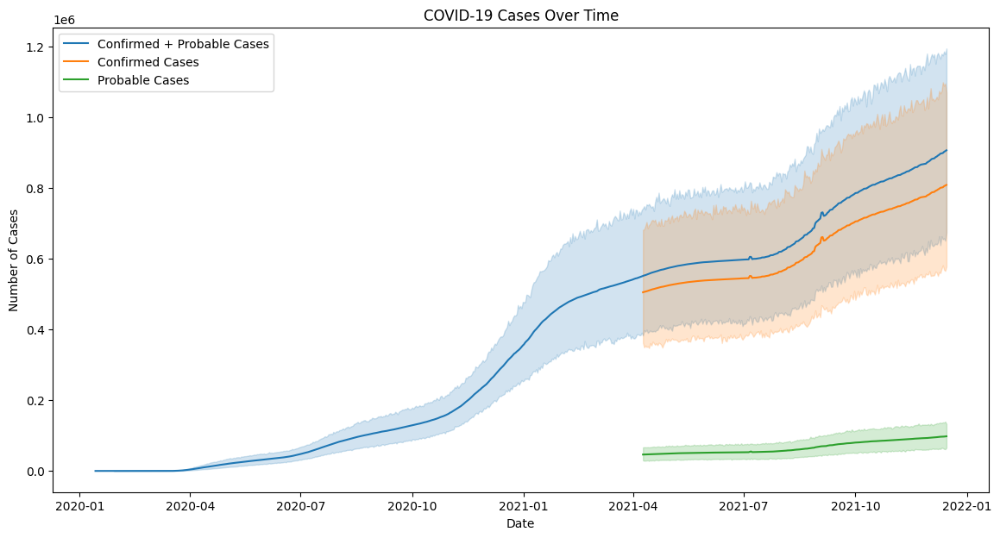

In [14]:
# 1. Time Series Plot
plt.figure(figsize=(14, 7))
sns.lineplot(x='date', y='cases_conf_probable', data=df, label='Confirmed + Probable Cases')
sns.lineplot(x='date', y='cases_confirmed', data=df, label='Confirmed Cases')
sns.lineplot(x='date', y='cases_probable', data=df, label='Probable Cases')
plt.title('COVID-19 Cases Over Time')
plt.xlabel('Date')
plt.ylabel('Number of Cases')
plt.legend()
plt.show()



As I investigate the trends in COVID-19 cases over time, I notice that the cumulative totals for confirmed and probable cases consistently rise. The blue line, representing the combined total, shows a sharp increase around early 2021. Both the orange line for confirmed cases and the green line for probable cases also follow this upward trend.

This histogram reveals that most of the total viral tests are concentrated at the lower end, indicating that many regions conducted fewer tests. There's a steep drop-off as the number of tests increases, suggesting that only a few regions performed a significantly higher number of tests. The right-skewed distribution highlights the disparity in testing across different areas.

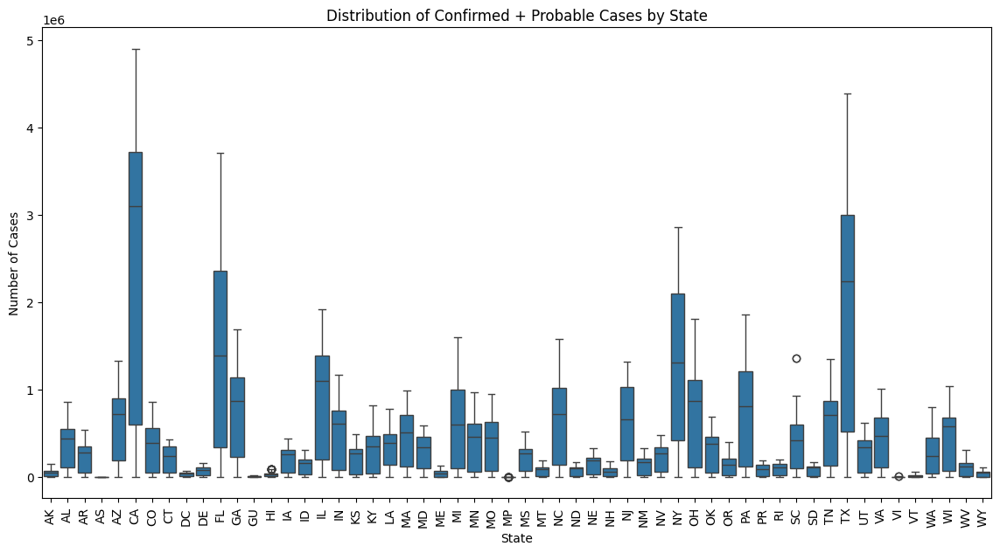

In [15]:
# 3. Box Plot
plt.figure(figsize=(14, 7))
sns.boxplot(x='state', y='cases_conf_probable', data=df)
plt.title('Distribution of Confirmed + Probable Cases by State')
plt.xlabel('State')
plt.ylabel('Number of Cases')
plt.xticks(rotation=90)
plt.show()



This box plot illustrates the distribution of confirmed and probable COVID-19 cases across various states. Some states, like California and Texas, exhibit a wide range and higher number of cases, as indicated by the tall boxes and whiskers. Other states show a more consistent and lower number of cases, with smaller boxes and shorter whiskers. This visualization highlights the significant variation in COVID-19 impact among different states.



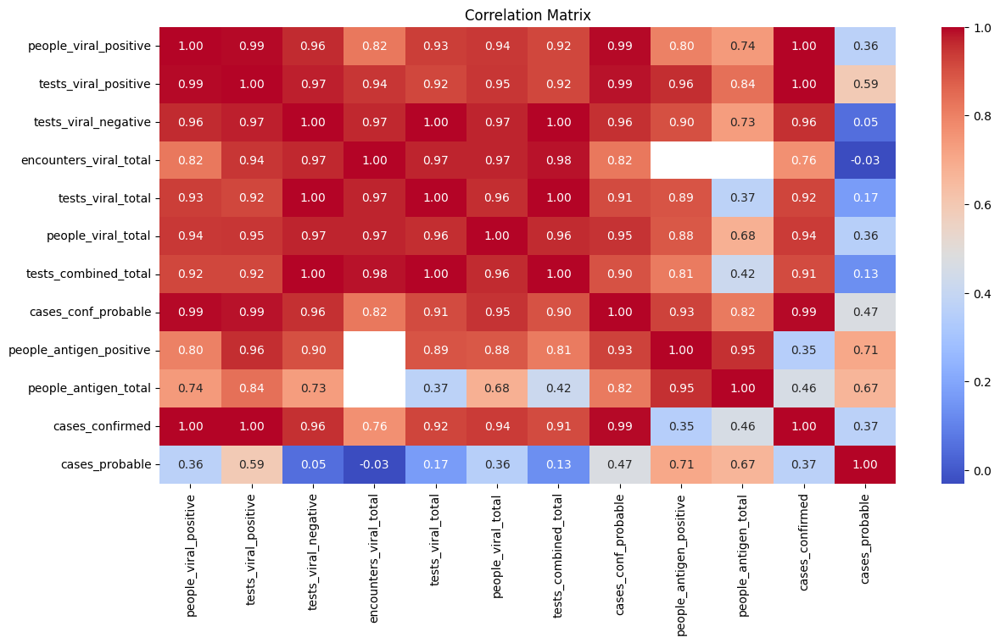

In [16]:
# Select only numeric columns for correlation
numeric_df = df.select_dtypes(include='number')
# 4. Heatmap for Correlation
plt.figure(figsize=(14, 7))
correlation_matrix = numeric_df.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Matrix')
plt.show()



High correlation between tests_viral_negative and other testing metrics, indicating consistency in testing patterns.
Moderate correlation between people_antigen_positive and cases_probable, reflecting the relationship between antigen tests and probable case counts.

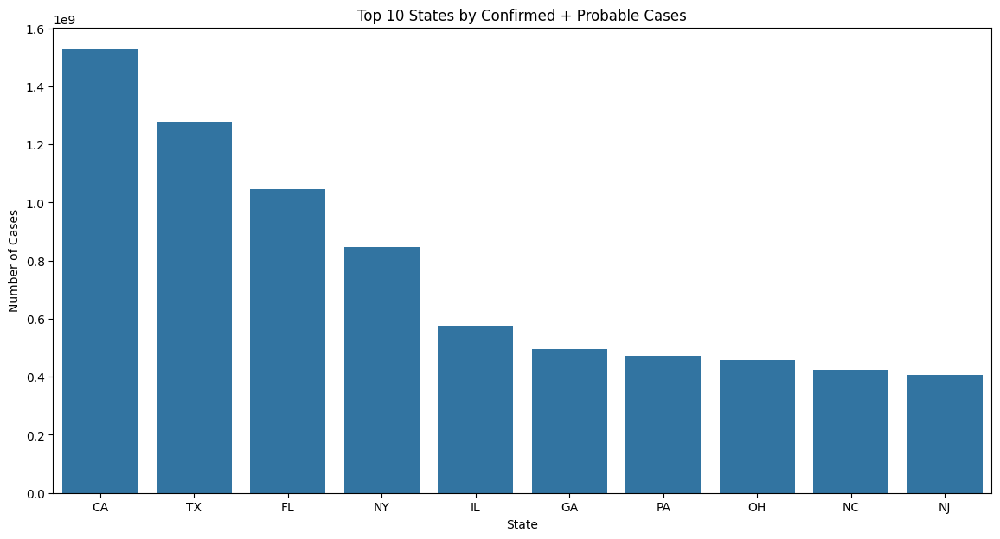

In [17]:
# 5. Bar Chart
plt.figure(figsize=(14, 7))
state_cases = df.groupby('state')['cases_conf_probable'].sum().sort_values(ascending=False).head(10)
sns.barplot(x=state_cases.index, y=state_cases.values)
plt.title('Top 10 States by Confirmed + Probable Cases')
plt.xlabel('State')
plt.ylabel('Number of Cases')
plt.show()



California (CA) has the highest number of cases, followed by Texas (TX) and Florida (FL). New York (NY) also shows a significant number of cases. The chart highlights the states with the most substantial COVID-19 impact, with a noticeable drop in case numbers after the top three states.

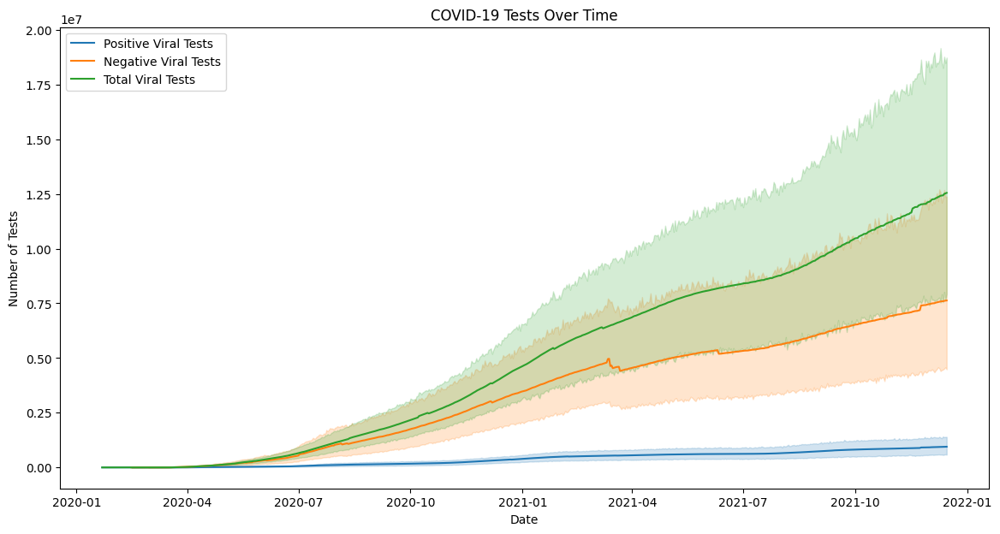

In [18]:
# 6. Line Chart for Multiple Variables Over Time
plt.figure(figsize=(14, 7))
sns.lineplot(x='date', y='tests_viral_positive', data=df, label='Positive Viral Tests')
sns.lineplot(x='date', y='tests_viral_negative', data=df, label='Negative Viral Tests')
sns.lineplot(x='date', y='tests_viral_total', data=df, label='Total Viral Tests')
plt.title('COVID-19 Tests Over Time')
plt.xlabel('Date')
plt.ylabel('Number of Tests')
plt.legend()
plt.show()

All metrics show a steady increase over time, with total tests growing the fastest, followed by negative tests. Positive tests increase at a slower rate, highlighting the ongoing testing efforts and the relatively lower proportion of positive results.

### Shifting focus to New york data.

In [19]:
# Filtering New york Data

# Filter for New York State data
nydf = df[df['state'] == 'NY']

In [20]:
nydf.head()

,date,state,people_viral_positive,tests_viral_positive,tests_viral_negative,encounters_viral_total,tests_viral_total,people_viral_total,tests_combined_total,cases_conf_probable,people_antigen_positive,people_antigen_total,cases_confirmed,cases_probable
22327,2020-03-02,NY,0.0,NaN,NaN,0.0,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
22328,2020-03-03,NY,1.0,NaN,NaN,1.0,NaN,NaN,1.0,1.0,NaN,NaN,NaN,NaN
22329,2020-03-04,NY,1.0,NaN,NaN,10.0,NaN,NaN,10.0,1.0,NaN,NaN,NaN,NaN
22330,2020-03-05,NY,3.0,NaN,NaN,30.0,NaN,NaN,30.0,3.0,NaN,NaN,NaN,NaN
22331,2020-03-06,NY,25.0,NaN,NaN,122.0,NaN,NaN,122.0,25.0,NaN,NaN,NaN,NaN


In [21]:
nydf.to_csv('newyork_data_raw.csv', index=False)
print("New York data saved successfully as newyork_data.csv")

New York data saved successfully as newyork_data.csv


In [22]:
# Display basic information about the data
print("Data Overview:")
print(nydf.info())

Data Overview:
<class 'pandas.core.frame.DataFrame'>
Index: 654 entries, 22327 to 36609
Data columns (total 14 columns):
 #   Column                   Non-Null Count  Dtype         
---  ------                   --------------  -----         
 0   date                     654 non-null    datetime64[ns]
 1   state                    654 non-null    object        
 2   people_viral_positive    654 non-null    float64       
 3   tests_viral_positive     0 non-null      float64       
 4   tests_viral_negative     0 non-null      float64       
 5   encounters_viral_total   654 non-null    float64       
 6   tests_viral_total        0 non-null      float64       
 7   people_viral_total       0 non-null      float64       
 8   tests_combined_total     654 non-null    float64       
 9   cases_conf_probable      654 non-null    float64       
 10  people_antigen_positive  0 non-null      float64       
 11  people_antigen_total     0 non-null      float64       
 12  cases_confirmed     

In [23]:
# Summary statistics
print("\nSummary Statistics:")
print(nydf.describe().to_string())


Summary Statistics:
                      date  people_viral_positive  tests_viral_positive  tests_viral_negative  encounters_viral_total  tests_viral_total  people_viral_total  tests_combined_total  cases_conf_probable  people_antigen_positive  people_antigen_total  cases_confirmed  cases_probable
count                  654           6.540000e+02                   0.0                   0.0            6.540000e+02                0.0                 0.0          6.540000e+02         6.540000e+02                      0.0                   0.0     2.510000e+02           251.0
mean   2021-01-22 12:00:00           1.292877e+06                   NaN                   NaN            3.382254e+07                NaN                 NaN          3.382254e+07         1.292877e+06                      NaN                   NaN     2.275027e+06             0.0
min    2020-03-02 00:00:00           0.000000e+00                   NaN                   NaN            0.000000e+00                NaN   

In [24]:
# Find null values
null_values_ny = nydf.isnull().sum()

# Calculate proportion of null values
proportion_null_ny = null_values_ny / len(nydf)

# Display the results
print("Null Values:")
print(null_values_ny)
print("\nProportion of Null Values:")
print(proportion_null_ny)

Null Values:
date                         0
state                        0
people_viral_positive        0
tests_viral_positive       654
tests_viral_negative       654
encounters_viral_total       0
tests_viral_total          654
people_viral_total         654
tests_combined_total         0
cases_conf_probable          0
people_antigen_positive    654
people_antigen_total       654
cases_confirmed            403
cases_probable             403
dtype: int64

Proportion of Null Values:
date                       0.000000
state                      0.000000
people_viral_positive      0.000000
tests_viral_positive       1.000000
tests_viral_negative       1.000000
encounters_viral_total     0.000000
tests_viral_total          1.000000
people_viral_total         1.000000
tests_combined_total       0.000000
cases_conf_probable        0.000000
people_antigen_positive    1.000000
people_antigen_total       1.000000
cases_confirmed            0.616208
cases_probable             0.616208
dtype: f

### Deriving Columns
tests_viral_total: This can be derived as the sum of tests_viral_positive and tests_viral_negative.
cases_conf_probable: This can be derived as the sum of cases_confirmed and cases_probable.

In [25]:
# Derive 'tests_viral_total' if 'tests_viral_positive' and 'tests_viral_negative' are available
if 'tests_viral_positive' in nydf.columns and 'tests_viral_negative' in nydf.columns:
    nydf['tests_viral_total'] = nydf['tests_viral_positive'] + nydf['tests_viral_negative']

# Derive 'cases_conf_probable' if 'cases_confirmed' and 'cases_probable' are available
if 'cases_confirmed' in nydf.columns and 'cases_probable' in nydf.columns:
    nydf['cases_conf_probable'] = nydf['cases_confirmed'] + nydf['cases_probable']


C:\Users\princ\AppData\Local\Temp\ipykernel_9588\413438705.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\princ\AppData\Local\Temp\ipykernel_9588\413438705.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [26]:
# Display derived columns and remaining null values
print("\nNull Values After Derivation:")
print(nydf.isnull().sum())



Null Values After Derivation:
date                         0
state                        0
people_viral_positive        0
tests_viral_positive       654
tests_viral_negative       654
encounters_viral_total       0
tests_viral_total          654
people_viral_total         654
tests_combined_total         0
cases_conf_probable        403
people_antigen_positive    654
people_antigen_total       654
cases_confirmed            403
cases_probable             403
dtype: int64


In [27]:

# Display the cleaned dataset summary
print("Cleaned Data Overview After Derivation:")
print(nydf.info())

Cleaned Data Overview After Derivation:
<class 'pandas.core.frame.DataFrame'>
Index: 654 entries, 22327 to 36609
Data columns (total 14 columns):
 #   Column                   Non-Null Count  Dtype         
---  ------                   --------------  -----         
 0   date                     654 non-null    datetime64[ns]
 1   state                    654 non-null    object        
 2   people_viral_positive    654 non-null    float64       
 3   tests_viral_positive     0 non-null      float64       
 4   tests_viral_negative     0 non-null      float64       
 5   encounters_viral_total   654 non-null    float64       
 6   tests_viral_total        0 non-null      float64       
 7   people_viral_total       0 non-null      float64       
 8   tests_combined_total     654 non-null    float64       
 9   cases_conf_probable      251 non-null    float64       
 10  people_antigen_positive  0 non-null      float64       
 11  people_antigen_total     0 non-null      float64       


## Analysis:
* 1. Complete Missing Data: Some columns (tests_viral_positive, tests_viral_negative, tests_viral_total, people_viral_total, people_antigen_positive, people_antigen_total) have 100% missing values. These columns cannot provide any useful information and should likely be dropped.
* 2. Partial Missing Data: Columns cases_conf_probable, cases_confirmed, and cases_probable have about 61.6% missing values. These columns can potentially be imputed if the missingness mechanism is understood. In order to understand Missingness Little MCAR test is highly preferable.

In [28]:
# Display the cleaned dataset summary statistics
print("\nCleaned Summary Statistics After Derivation:")
print(nydf.describe().to_string())


Cleaned Summary Statistics After Derivation:
                      date  people_viral_positive  tests_viral_positive  tests_viral_negative  encounters_viral_total  tests_viral_total  people_viral_total  tests_combined_total  cases_conf_probable  people_antigen_positive  people_antigen_total  cases_confirmed  cases_probable
count                  654           6.540000e+02                   0.0                   0.0            6.540000e+02                0.0                 0.0          6.540000e+02         2.510000e+02                      0.0                   0.0     2.510000e+02           251.0
mean   2021-01-22 12:00:00           1.292877e+06                   NaN                   NaN            3.382254e+07                NaN                 NaN          3.382254e+07         2.275027e+06                      NaN                   NaN     2.275027e+06             0.0
min    2020-03-02 00:00:00           0.000000e+00                   NaN                   NaN            0.000000e

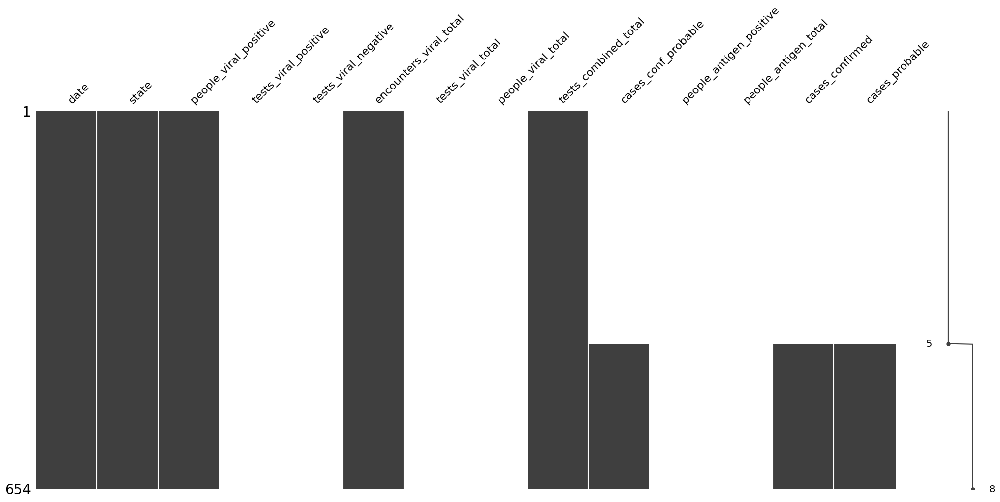

In [29]:
# Visualize missing data matrix
msno.matrix(nydf)
plt.show()

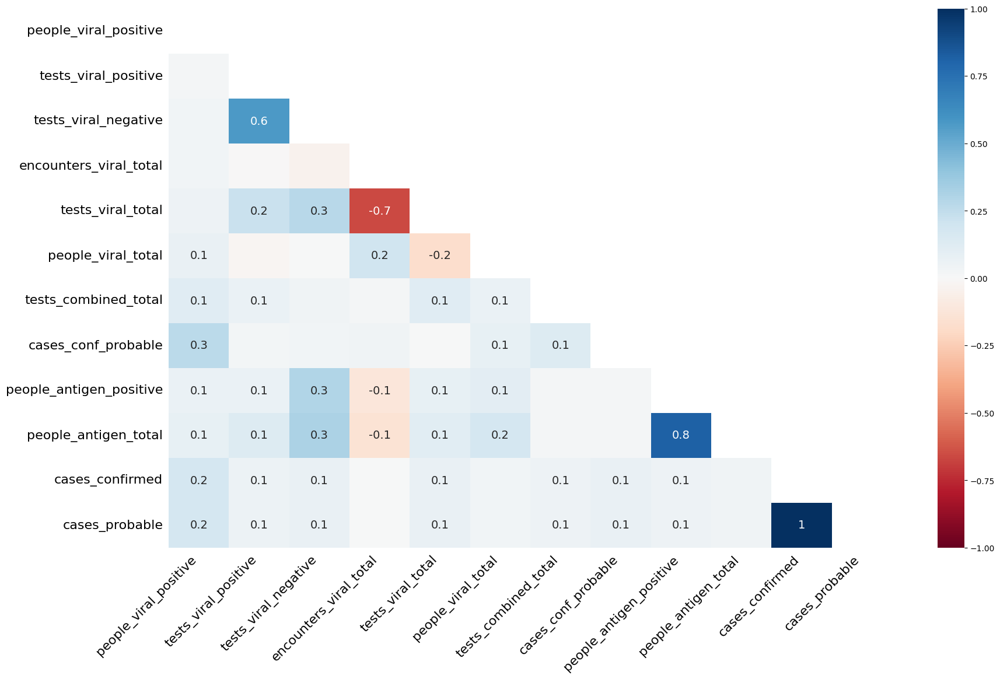

In [30]:
# Visualize missing data heatmap to check correlations
msno.heatmap(df)
plt.show()


Recommendations:

Imputation:

* For columns with moderate missing data, employ imputation techniques.
* Numerical Data: Use the mean, median, or mode to fill in missing values, maintaining the central tendency.
* Categorical Data: Use the mode to replace missing values, preserving the most common category.

Data Quality Check:

* Investigate the causes of missing data to identify if they stem from reporting issues, data entry errors, or other factors.
* Source Investigation: Understanding the source of missing data helps identify systematic issues in data collection and reporting.
* Process Improvement: Implementing robust data collection and reporting protocols can reduce future missing data.

Sensitivity Analysis:

* Conduct sensitivity analyses to assess how different imputation methods impact the results.
* Robustness Assurance: Sensitivity analysis ensures conclusions remain reliable despite imputed values.

In [31]:
nydf.head()

,date,state,people_viral_positive,tests_viral_positive,tests_viral_negative,encounters_viral_total,tests_viral_total,people_viral_total,tests_combined_total,cases_conf_probable,people_antigen_positive,people_antigen_total,cases_confirmed,cases_probable
22327,2020-03-02,NY,0.0,NaN,NaN,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN
22328,2020-03-03,NY,1.0,NaN,NaN,1.0,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN
22329,2020-03-04,NY,1.0,NaN,NaN,10.0,NaN,NaN,10.0,NaN,NaN,NaN,NaN,NaN
22330,2020-03-05,NY,3.0,NaN,NaN,30.0,NaN,NaN,30.0,NaN,NaN,NaN,NaN,NaN
22331,2020-03-06,NY,25.0,NaN,NaN,122.0,NaN,NaN,122.0,NaN,NaN,NaN,NaN,NaN


In [32]:
average_tests_combined_total = nydf['tests_combined_total'].mean()
print(average_tests_combined_total)

33822544.056574926


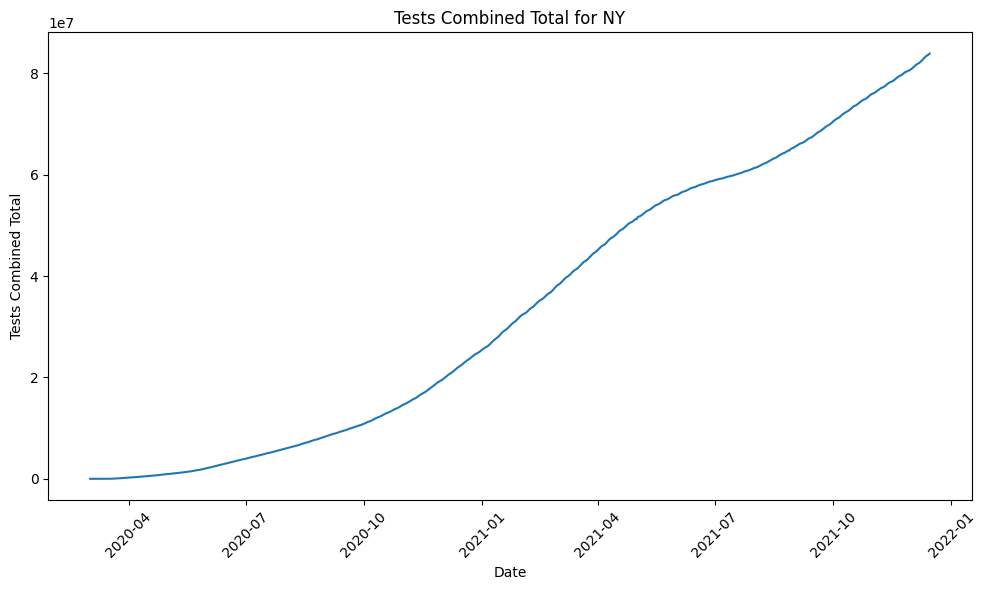

In [33]:
# Filter the data for NY
ny_data = nydf

# Extract the date and tests_combined_total columns
dates = ny_data['date']
tests_combined_total = ny_data['tests_combined_total']

# Create the plot
plt.figure(figsize=(10, 6))
plt.plot(dates, tests_combined_total)
plt.title('Tests Combined Total for NY')
plt.xlabel('Date')
plt.ylabel('Tests Combined Total')
plt.xticks(rotation=45)
plt.tight_layout()

# Display the plot
plt.show()

In [36]:
# if interactive is an option, you can use the following code to save the plot as an interactive chart.

# Create an interactive line chart using Plotly
fig = px.line(ny_data, x='date', y='tests_combined_total', 
              title='Tests Combined Total for NY',
              labels={'date': 'Date', 'tests_combined_total': 'Tests Combined Total'})

# Update the layout for better visualization
fig.update_layout(
    xaxis_title='Date',
    yaxis_title='Tests Combined Total',
    xaxis=dict(tickangle=-45),
    template='plotly_white'
)

# Display the plot
fig.show()

In [34]:
# Saving final csv file
nydf.to_csv('newyork_data_cleaned.csv', index=False)
print("Cleaned New York data saved successfully as newyork_data.csv")

Cleaned New York data saved successfully as newyork_data.csv
